In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import pickle5
import pickle

import numpy as np
from PIL import Image
import cv2
import imageio

import tensorboard
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator
from tensorboard.backend.event_processing.event_file_loader import EventFileLoader

In [11]:
import utils2 as ut
import training as tr
import init_training
import model as m
import local_datasets

import argparse
import yaml
import torch
import os
from torch.utils.data import DataLoader

/home/burkuc/.conda/envs/etor2/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [12]:
import dynaphos
from dynaphos.cortex_models import get_visual_field_coordinates_probabilistically
from dynaphos.simulator import GaussianSimulator as PhospheneSimulator
from dynaphos.utils import get_data_kwargs

In [2]:
def gather_data(list_exp_dir):
    df_train_all=pd.DataFrame()
    df_val_all=pd.DataFrame()

    dict_exps = {}
    dict_runs = {}
    for exp_no, exp_directories in enumerate(list_exp_dir):
        print('exp_no', exp_no, 'exp_directories', exp_directories)
        df_train_exp=pd.DataFrame()
        df_val_exp=pd.DataFrame()

        
        for seed, run_dir in enumerate(exp_directories):
            print('seed', seed,"run_dir", run_dir )

            df_train_sum=pd.read_csv(run_dir+"/training_summary.csv")
            df_val_sum =pd.read_csv(run_dir+"/validation_summary.csv")

            df_train_exp[f"recon_loss_e{exp_no}_s{seed}"]=df_train_sum["reconstruction_loss"]
            df_val_exp[f"recon_loss_e{exp_no}_s{seed}"]=df_val_sum["reconstruction_loss"]

            df_train_exp[f"reg_loss_e{exp_no}_s{seed}"]=df_train_sum["regularization_loss"]
            df_val_exp[f"reg_loss_e{exp_no}_s{seed}"]=df_val_sum["regularization_loss"]

            df_train_exp[f"total_loss_e{exp_no}_s{seed}"]=df_train_sum["total"]
            df_val_exp[f"total_loss_e{exp_no}_s{seed}"]=df_val_sum["total"]


            dict_runs[f'train_e{exp_no}_s{seed}']=df_train_sum
            dict_runs[f'val_e{exp_no}_s{seed}']=df_val_sum
        
        dic_train_relevant_columns={key: [] for key in ["recon", "reg", "total"]}
        for col in list(df_train_exp):
            print('col', col)
            if "recon_loss" in col:
                dic_train_relevant_columns["recon"].append(col)
            elif "reg_loss" in col:
                dic_train_relevant_columns["reg"].append(col)
            elif "total_loss" in col:
                dic_train_relevant_columns["total"].append(col)
        
        dic_val_relevant_columns={key: [] for key in ["recon", "reg", "total"]}
        for col in list(df_val_exp):
            if "recon_loss" in col:
                dic_val_relevant_columns["recon"].append(col)
            elif "reg_loss" in col:
                dic_val_relevant_columns["reg"].append(col)
            elif "total_loss" in col:
                dic_val_relevant_columns["total"].append(col)

        df_train_all[f"avg_recon_loss_e{exp_no}"]= df_train_exp[dic_train_relevant_columns['recon']].mean(axis=1)
        df_train_all[f"std_recon_loss_e{exp_no}"]= df_train_exp[dic_train_relevant_columns['recon']].sem(axis=1)

        df_val_all[f"avg_recon_loss_e{exp_no}"]= df_val_exp[dic_val_relevant_columns['recon']].mean(axis=1)
        df_val_all[f"std_recon_loss_e{exp_no}"]= df_val_exp[dic_val_relevant_columns['recon']].sem(axis=1)

        df_train_all[f"avg_reg_loss_e{exp_no}"]= df_train_exp[dic_train_relevant_columns['reg']].mean(axis=1)
        df_train_all[f"std_reg_loss_e{exp_no}"]= df_train_exp[dic_train_relevant_columns['reg']].sem(axis=1)

        df_val_all[f"avg_reg_loss_e{exp_no}"]= df_val_exp[dic_val_relevant_columns['reg']].mean(axis=1)
        df_val_all[f"std_reg_loss_e{exp_no}"]= df_val_exp[dic_val_relevant_columns['reg']].sem(axis=1)

        df_train_all[f"avg_total_loss_e{exp_no}"]= df_train_exp[dic_train_relevant_columns['total']].mean(axis=1)
        df_train_all[f"std_total_loss_e{exp_no}"]= df_train_exp[dic_train_relevant_columns['total']].sem(axis=1)

        df_val_all[f"avg_total_loss_e{exp_no}"]= df_val_exp[dic_val_relevant_columns['total']].mean(axis=1)
        df_val_all[f"std_total_loss_e{exp_no}"]= df_val_exp[dic_val_relevant_columns['total']].sem(axis=1)


        dict_exps[f'train_e{exp_no}']=df_train_exp
        dict_exps[f'val_e{exp_no}']=df_val_exp

    return df_train_all, df_val_all, dict_exps, dict_runs
        

In [3]:
def plot_within_experiment(dict_runs, dict_exps):
    # for key in dict_runs.keys():
    #     if "train" in key:
    #         dict_runs[key].set_index("epochs").plot(y=["total", "reconstruction_loss","regularization_loss"], title="Training", legend='reverse')
    #         plt.show()
            
    #     elif "val" in key:

    #         dict_runs[key].set_index("epochs").plot(y=["total", "reconstruction_loss","regularization_loss"], title="Validation", legend='reverse')
    #         plt.show()
    

    for k, key in enumerate(dict_runs):
        
        if "train" in key:
            train = dict_runs[key]

        elif "val" in key:
            val = dict_runs[key]

        if k%2==1:
            fig, ax = plt.subplots()
            ax2 = ax.twinx()
            train.plot(x="epochs", y=["total", "reconstruction_loss","regularization_loss"], ax=ax, title=f'Exp. {(k-1)//2} - Seed {key.split("s")[-1]}', ylim=(0,0.25), label=["tr. total loss " + key.split("s")[-1], "tr. recon. loss " + key.split("s")[-1], "tr. reg. loss " + key.split("s")[-1]])
            val.plot(x="epochs", y=["total", "reconstruction_loss","regularization_loss"], ax=ax2, ls="--", title=f'Exp. {(k-1)//2} - Seed {key.split("s")[-1]}', ylim=(0,0.25), label=["val. total loss " + key.split("s")[-1], "val. recon. loss " + key.split("s")[-1], "val. reg. loss " + key.split("s")[-1]])

            plt.show()


In [4]:
def plot_within_experiment2(dict_runs, dict_exps):
    # for key in dict_runs.keys():
    #     if "train" in key:
    #         dict_runs[key].set_index("epochs").plot(y=["total", "reconstruction_loss","regularization_loss"], title="Training", legend='reverse')
    #         plt.show()
            
    #     elif "val" in key:

    #         dict_runs[key].set_index("epochs").plot(y=["total", "reconstruction_loss","regularization_loss"], title="Validation", legend='reverse')
    #         plt.show()
    

    for k, key in enumerate(dict_runs):
        
        if "train" in key:
            train = dict_runs[key]

        elif "val" in key:
            val = dict_runs[key]

        if k%2==1:
            
            fig, (ax, ax3) = plt.subplots(1,2, figsize=(20,6),dpi=120)
            ax2 = ax.twinx()
            
            train.plot(x="epochs", y=["total", "reconstruction_loss"], ax=ax, title=f'Exp. {(k-1)//2} - Seed {key.split("s")[-1]}', ylim=(0,0.25), label=["tr. total loss " + key.split("s")[-1], "tr. recon. loss " + key.split("s")[-1]])
            val.plot(x="epochs", y=["total", "reconstruction_loss"], ax=ax2, ls="--", title=f'Exp. {(k-1)//2} - Seed {key.split("s")[-1]}', ylim=(0,0.25), label=["val. total loss " + key.split("s")[-1], "val. recon. loss " + key.split("s")[-1]])
            

            ax4 = ax3.twinx()
            print(train["regularization_loss"].min(), train["regularization_loss"].max())
            print(val["regularization_loss"].min(), val["regularization_loss"].max())
            reg_loss_train_normalized = (train["regularization_loss"]-train["regularization_loss"].min())/(train["regularization_loss"].max()-train["regularization_loss"].min())
            reg_loss_val_normalized = (val["regularization_loss"]-val["regularization_loss"].min())/(val["regularization_loss"].max()-val["regularization_loss"].min())
            ax3.plot(train["epochs"], reg_loss_train_normalized, label="tr. reg. loss " + key.split("s")[-1])
            ax4.plot(val["epochs"], reg_loss_val_normalized, ls="--", label="val. reg. loss " + key.split("s")[-1])
            
            ax.legend()
            ax2.legend()
            ax3.legend()
            ax4.legend()
            # train.plot(x="epochs", y=["regularization_loss"], ax=ax3, title=f'Exp. {(k-1)//2} - Seed {key.split("s")[-1]}', ylim=(train["regularization_loss"].min(),train["regularization_loss"].max()), label=["tr. reg. loss " + key.split("s")[-1]])
            # val.plot(x="epochs", y=["regularization_loss"], ax=ax4, ls="--", title=f'Exp. {(k-1)//2} - Seed {key.split("s")[-1]}', ylim=(val["regularization_loss"].min(),val["regularization_loss"].max()), label=["val. reg. loss " + key.split("s")[-1]])

            plt.show()


In [78]:
def plot_across_experiments(df_train_all, df_val_all):
    # fig, ax = plt.subplots() 
    fig, (ax1, ax2) = plt.subplots(1,2,figsize=(20,6),dpi=120)
    for e in range(len(list(df_train_all))//(2*3)):
        if e==0:
            exp='EXP_DIR_3DCONV'
        elif e==1:
            exp="EXP_DIR_RNN"
        elif e==2:
            exp="EXP_DIR_3DCONV_UNCONS"
        elif e==3:
            exp="EXP_DIR_3DCONV_OUT3_UNCONS"
        elif e==4:
            exp="EXP_DIR_RNN_OUT3_UNCONS"
            
        elif e==5:
            exp="EXP_DIR_3DCONV_OUT3_ALLCONS500"
        elif e==6:
            exp="EXP_DIR_3DCONV_OUT3_ALLCONS_2ONFR"

        e=str(e)

        x=df_train_all.index
    

        x=df_train_all.index
        ax1.plot(df_train_all["avg_total_loss_e"+e], label="tr_total_loss_"+exp)#, color='tab:purple')
        ax1.plot(df_train_all["avg_recon_loss_e"+e],label="tr_recon_loss_"+exp)#, color='tab:red' )
        ax1.plot(df_train_all["avg_reg_loss_e"+e], label="tr_reg_loss_"+exp)#, color='tab:blue')

        # ax1.fill_between(df_train_all["avg_total_loss_e"+e]-df_train_all["std_total_loss_e"+e], df_train_all["avg_total_loss_e"+e]+df_train_all["std_total_loss_e"+e], alpha=0.35, label="tr_total_loss_SEM_"+exp)#, color='tab:purple')
        # ax1.fill_between(df_train_all["avg_recon_loss_e"+e]-df_train_all["std_recon_loss_e"+e], df_train_all["avg_recon_loss_e"+e]+df_train_all["std_recon_loss_e"+e], alpha=0.35, label="tr_recon_loss_SEM_"+exp)#, color='tab:red')
        # ax1.fill_between(df_train_all["avg_reg_loss_e"+e]-df_train_all["std_total_loss_e"+e], df_train_all["avg_reg_loss_e"+e]+df_train_all["std_total_loss_e"+e], alpha=0.35, label="tr_reg_loss_SEM_"+exp)#, color='tab:blue')


        ax2.plot(df_val_all["avg_total_loss_e"+e], label="val_total_loss_"+exp)#, ls='--', color='tab:purple')
        ax2.plot(df_val_all["avg_recon_loss_e"+e],label="val_recon_loss_"+exp)#, ls='--', color='tab:red')
        ax2.plot(df_val_all["avg_reg_loss_e"+e], label="val_reg_loss_"+exp)#, ls='--', color='tab:blue')

        # ax2.fill_between(df_val_all["avg_total_loss_e"+e]-df_val_all["std_total_loss_e"+e], df_val_all["avg_total_loss_e"+e]+df_val_all["std_total_loss_e"+e], alpha=0.35, label="val_total_loss_SEM_"+exp)#, color='tab:purple')
        # ax2.fill_between(df_val_all["avg_recon_loss_e"+e]-df_val_all["std_recon_loss_e"+e], df_val_all["avg_recon_loss_e"+e]+df_val_all["std_recon_loss_e"+e], alpha=0.35, label="val_recon_loss_SEM_"+exp)#, color='tab:red')
        # ax2.fill_between(df_val_all["avg_reg_loss_e"+e]-df_val_all["std_total_loss_e"+e], df_val_all["avg_reg_loss_e"+e]+df_val_all["std_total_loss_e"+e], alpha=0.35, label="val_reg_loss_SEM_"+exp)#, color='tab:blue')
        

        ax1.legend()
        ax2.legend()
        
    plt.show()
    

In [80]:
def plot_across_experiments_total(df_train_all, df_val_all):
    # fig, ax = plt.subplots() 
    fig, (ax1, ax2) = plt.subplots(1,2,figsize=(20,6),dpi=120)
    for e in range(len(list(df_train_all))//(2*3)):
        if e==0:
            exp='EXP_DIR_3DCONV'
        elif e==1:
            exp="EXP_DIR_RNN"
        elif e==2:
            exp="EXP_DIR_3DCONV_UNCONS"
        elif e==3:
            exp="EXP_DIR_3DCONV_OUT3_UNCONS"
        elif e==4:
            exp="EXP_DIR_RNN_OUT3_UNCONS"
            
        elif e==5:
            exp="EXP_DIR_3DCONV_OUT3_ALLCONS500"
        elif e==6:
            exp="EXP_DIR_3DCONV_OUT3_ALLCONS_2ONFR"

        e=str(e)

        x=df_train_all.index
    

        x=df_train_all.index
        ax1.plot(df_train_all["avg_total_loss_e"+e], label="tr_total_loss_"+exp)#, color='tab:purple')
        # ax1.plot(df_train_all["avg_recon_loss_e"+e],label="tr_recon_loss_"+exp)#, color='tab:red' )
        # ax1.plot(df_train_all["avg_reg_loss_e"+e], label="tr_reg_loss_"+exp)#, color='tab:blue')

        # ax1.fill_between(df_train_all["avg_total_loss_e"+e]-df_train_all["std_total_loss_e"+e], df_train_all["avg_total_loss_e"+e]+df_train_all["std_total_loss_e"+e], alpha=0.35, label="tr_total_loss_SEM_"+exp)#, color='tab:purple')
        # ax1.fill_between(df_train_all["avg_recon_loss_e"+e]-df_train_all["std_recon_loss_e"+e], df_train_all["avg_recon_loss_e"+e]+df_train_all["std_recon_loss_e"+e], alpha=0.35, label="tr_recon_loss_SEM_"+exp)#, color='tab:red')
        # ax1.fill_between(df_train_all["avg_reg_loss_e"+e]-df_train_all["std_total_loss_e"+e], df_train_all["avg_reg_loss_e"+e]+df_train_all["std_total_loss_e"+e], alpha=0.35, label="tr_reg_loss_SEM_"+exp)#, color='tab:blue')


        ax2.plot(df_val_all["avg_total_loss_e"+e], label="val_total_loss_"+exp)#, ls='--', color='tab:purple')
        # ax2.plot(df_val_all["avg_recon_loss_e"+e],label="val_recon_loss_"+exp)#, ls='--', color='tab:red')
        # ax2.plot(df_val_all["avg_reg_loss_e"+e], label="val_reg_loss_"+exp)#, ls='--', color='tab:blue')

        # ax2.fill_between(df_val_all["avg_total_loss_e"+e]-df_val_all["std_total_loss_e"+e], df_val_all["avg_total_loss_e"+e]+df_val_all["std_total_loss_e"+e], alpha=0.35, label="val_total_loss_SEM_"+exp)#, color='tab:purple')
        # ax2.fill_between(df_val_all["avg_recon_loss_e"+e]-df_val_all["std_recon_loss_e"+e], df_val_all["avg_recon_loss_e"+e]+df_val_all["std_recon_loss_e"+e], alpha=0.35, label="val_recon_loss_SEM_"+exp)#, color='tab:red')
        # ax2.fill_between(df_val_all["avg_reg_loss_e"+e]-df_val_all["std_total_loss_e"+e], df_val_all["avg_reg_loss_e"+e]+df_val_all["std_total_loss_e"+e], alpha=0.35, label="val_reg_loss_SEM_"+exp)#, color='tab:blue')
        

        ax1.legend()
        ax2.legend()
        
    plt.show()

In [82]:
def plot_across_experiments_recon(df_train_all, df_val_all):
    # fig, ax = plt.subplots() 
    fig, (ax1, ax2) = plt.subplots(1,2,figsize=(20,6),dpi=120)
    for e in range(len(list(df_train_all))//(2*3)):
        if e==0:
            exp='EXP_DIR_3DCONV'
        elif e==1:
            exp="EXP_DIR_RNN"
        elif e==2:
            exp="EXP_DIR_3DCONV_UNCONS"
        elif e==3:
            exp="EXP_DIR_3DCONV_OUT3_UNCONS"
        elif e==4:
            exp="EXP_DIR_RNN_OUT3_UNCONS"
            
        elif e==5:
            exp="EXP_DIR_3DCONV_OUT3_ALLCONS500"
        elif e==6:
            exp="EXP_DIR_3DCONV_OUT3_ALLCONS_2ONFR"

        e=str(e)

        x=df_train_all.index
    

        x=df_train_all.index
        # ax1.plot(df_train_all["avg_total_loss_e"+e], label="tr_total_loss_"+exp)#, color='tab:purple')
        ax1.plot(df_train_all["avg_recon_loss_e"+e],label="tr_recon_loss_"+exp)#, color='tab:red' )
        # ax1.plot(df_train_all["avg_reg_loss_e"+e], label="tr_reg_loss_"+exp)#, color='tab:blue')

        # ax1.fill_between(df_train_all["avg_total_loss_e"+e]-df_train_all["std_total_loss_e"+e], df_train_all["avg_total_loss_e"+e]+df_train_all["std_total_loss_e"+e], alpha=0.35, label="tr_total_loss_SEM_"+exp)#, color='tab:purple')
        # ax1.fill_between(df_train_all["avg_recon_loss_e"+e]-df_train_all["std_recon_loss_e"+e], df_train_all["avg_recon_loss_e"+e]+df_train_all["std_recon_loss_e"+e], alpha=0.35, label="tr_recon_loss_SEM_"+exp)#, color='tab:red')
        # ax1.fill_between(df_train_all["avg_reg_loss_e"+e]-df_train_all["std_total_loss_e"+e], df_train_all["avg_reg_loss_e"+e]+df_train_all["std_total_loss_e"+e], alpha=0.35, label="tr_reg_loss_SEM_"+exp)#, color='tab:blue')


        # ax2.plot(df_val_all["avg_total_loss_e"+e], label="val_total_loss_"+exp)#, ls='--', color='tab:purple')
        ax2.plot(df_val_all["avg_recon_loss_e"+e],label="val_recon_loss_"+exp)#, ls='--', color='tab:red')
        # ax2.plot(df_val_all["avg_reg_loss_e"+e], label="val_reg_loss_"+exp)#, ls='--', color='tab:blue')

        # ax2.fill_between(df_val_all["avg_total_loss_e"+e]-df_val_all["std_total_loss_e"+e], df_val_all["avg_total_loss_e"+e]+df_val_all["std_total_loss_e"+e], alpha=0.35, label="val_total_loss_SEM_"+exp)#, color='tab:purple')
        # ax2.fill_between(df_val_all["avg_recon_loss_e"+e]-df_val_all["std_recon_loss_e"+e], df_val_all["avg_recon_loss_e"+e]+df_val_all["std_recon_loss_e"+e], alpha=0.35, label="val_recon_loss_SEM_"+exp)#, color='tab:red')
        # ax2.fill_between(df_val_all["avg_reg_loss_e"+e]-df_val_all["std_total_loss_e"+e], df_val_all["avg_reg_loss_e"+e]+df_val_all["std_total_loss_e"+e], alpha=0.35, label="val_reg_loss_SEM_"+exp)#, color='tab:blue')
        

        ax1.legend()
        ax2.legend()
        
    plt.show()
    

In [83]:
def plot_across_experiments_reg(df_train_all, df_val_all):
    # fig, ax = plt.subplots() 
    fig, (ax1, ax2) = plt.subplots(1,2,figsize=(20,6),dpi=120)
    for e in range(len(list(df_train_all))//(2*3)):
        if e==0:
            exp='EXP_DIR_3DCONV'
        elif e==1:
            exp="EXP_DIR_RNN"
        elif e==2:
            exp="EXP_DIR_3DCONV_UNCONS"
        elif e==3:
            exp="EXP_DIR_3DCONV_OUT3_UNCONS"
        elif e==4:
            exp="EXP_DIR_RNN_OUT3_UNCONS"
            
        elif e==5:
            exp="EXP_DIR_3DCONV_OUT3_ALLCONS500"
        elif e==6:
            exp="EXP_DIR_3DCONV_OUT3_ALLCONS_2ONFR"

        e=str(e)

        x=df_train_all.index
    

        x=df_train_all.index
        # ax1.plot(df_train_all["avg_total_loss_e"+e], label="tr_total_loss_"+exp)#, color='tab:purple')
        # ax1.plot(df_train_all["avg_recon_loss_e"+e],label="tr_recon_loss_"+exp)#, color='tab:red' )
        ax1.plot(df_train_all["avg_reg_loss_e"+e], label="tr_reg_loss_"+exp)#, color='tab:blue')

        # ax1.fill_between(df_train_all["avg_total_loss_e"+e]-df_train_all["std_total_loss_e"+e], df_train_all["avg_total_loss_e"+e]+df_train_all["std_total_loss_e"+e], alpha=0.35, label="tr_total_loss_SEM_"+exp)#, color='tab:purple')
        # ax1.fill_between(df_train_all["avg_recon_loss_e"+e]-df_train_all["std_recon_loss_e"+e], df_train_all["avg_recon_loss_e"+e]+df_train_all["std_recon_loss_e"+e], alpha=0.35, label="tr_recon_loss_SEM_"+exp)#, color='tab:red')
        # ax1.fill_between(df_train_all["avg_reg_loss_e"+e]-df_train_all["std_total_loss_e"+e], df_train_all["avg_reg_loss_e"+e]+df_train_all["std_total_loss_e"+e], alpha=0.35, label="tr_reg_loss_SEM_"+exp)#, color='tab:blue')


        # ax2.plot(df_val_all["avg_total_loss_e"+e], label="val_total_loss_"+exp)#, ls='--', color='tab:purple')
        # ax2.plot(df_val_all["avg_recon_loss_e"+e],label="val_recon_loss_"+exp)#, ls='--', color='tab:red')
        ax2.plot(df_val_all["avg_reg_loss_e"+e], label="val_reg_loss_"+exp)#, ls='--', color='tab:blue')

        # ax2.fill_between(df_val_all["avg_total_loss_e"+e]-df_val_all["std_total_loss_e"+e], df_val_all["avg_total_loss_e"+e]+df_val_all["std_total_loss_e"+e], alpha=0.35, label="val_total_loss_SEM_"+exp)#, color='tab:purple')
        # ax2.fill_between(df_val_all["avg_recon_loss_e"+e]-df_val_all["std_recon_loss_e"+e], df_val_all["avg_recon_loss_e"+e]+df_val_all["std_recon_loss_e"+e], alpha=0.35, label="val_recon_loss_SEM_"+exp)#, color='tab:red')
        # ax2.fill_between(df_val_all["avg_reg_loss_e"+e]-df_val_all["std_total_loss_e"+e], df_val_all["avg_reg_loss_e"+e]+df_val_all["std_total_loss_e"+e], alpha=0.35, label="val_reg_loss_SEM_"+exp)#, color='tab:blue')
        

        ax1.legend()
        ax2.legend()
        
    plt.show()
    

In [45]:
list_seeds_of_exp = []

In [21]:
EXP_DIR_3DCONV="/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_test" #single out
EXP_DIR_RNN="/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax" #single out, no readout!

In [22]:
EXP_DIR_3DCONV_UNCONS="/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_uncons"  #single output
# EXP_DIR_RNN="/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax" 

In [23]:
EXP_DIR_3DCONV_OUT3_UNCONS="/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_uncons" 
EXP_DIR_RNN_OUT3_UNCONS="/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax_out3_uncons"

In [24]:
EXP_DIR_3DCONV_OUT3_ALLCONS500="/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_allcons500"
# EXP_DIR_RNN_OUT3_ALLCONS500="/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_allcons500"

In [25]:
EXP_DIR_3DCONV_OUT3_ALLCONS_2ONFR="/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_allcons2onfr"
EXP_DIR_RNN_OUT3_ALLCONS_2ONFR="/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax_out3_allcons2onfr"

In [26]:
EXP_DIR_3DCONV_OUT3_ALLCONS_2ONPW="/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_allcons2onpw"
# EXP_DIR_RNN_OUT3_ALLCONS_2ONPW="/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_allcons500"

In [46]:
list_seeds_of_exp_0=[]
list_seeds_of_exp_0.append(EXP_DIR_3DCONV)
# list_seeds_of_exp_0.append(EXP_DIR_3DCONV)

list_seeds_of_exp.append(list_seeds_of_exp_0)
list_seeds_of_exp_0

['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_test']

In [62]:
transform_dict0=load_transform(EXP_DIR_3DCONV)

/home/burkuc/.conda/envs/etor2/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [47]:
list_seeds_of_exp_1=[]
list_seeds_of_exp_1.append(EXP_DIR_RNN)
#list_seeds_of_exp_1.append(EXP_DIR_RNN)

list_seeds_of_exp.append(list_seeds_of_exp_1)
list_seeds_of_exp_1

['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax']

In [63]:
transform_dict1=load_transform(EXP_DIR_RNN)

In [48]:
list_seeds_of_exp_2=[]
list_seeds_of_exp_2.append(EXP_DIR_3DCONV_UNCONS)
#list_seeds_of_exp_1.append(EXP_DIR_RNN)

list_seeds_of_exp.append(list_seeds_of_exp_2)
list_seeds_of_exp_2

['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_uncons']

In [64]:
transform_dict2=load_transform(EXP_DIR_3DCONV_UNCONS)

In [49]:
list_seeds_of_exp_3=[]
list_seeds_of_exp_3.append(EXP_DIR_3DCONV_OUT3_UNCONS)
#list_seeds_of_exp_1.append(EXP_DIR_RNN)

list_seeds_of_exp.append(list_seeds_of_exp_3)
list_seeds_of_exp_3

['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_uncons']

In [65]:
transform_dict3=load_transform(EXP_DIR_3DCONV_OUT3_UNCONS)

FileNotFoundError: [Errno 2] No such file or directory: '/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_uncons/output_history/stimulation.pickle'

In [50]:
list_seeds_of_exp_4=[]
list_seeds_of_exp_4.append(EXP_DIR_RNN_OUT3_UNCONS)
#list_seeds_of_exp_1.append(EXP_DIR_RNN)

list_seeds_of_exp.append(list_seeds_of_exp_4)
list_seeds_of_exp_4

['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax_out3_uncons']

In [ ]:
transform_dict4=load_transform(EXP_DIR_RNN_OUT3_UNCONS)

In [51]:
list_seeds_of_exp_5=[]
list_seeds_of_exp_5.append(EXP_DIR_3DCONV_OUT3_ALLCONS500)
#list_seeds_of_exp_1.append(EXP_DIR_RNN)

list_seeds_of_exp.append(list_seeds_of_exp_5)
list_seeds_of_exp_5

['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_allcons500']

In [ ]:
transform_dict5=load_transform(EXP_DIR_3DCONV_OUT3_ALLCONS500)

In [33]:
list_seeds_of_exp_6=[]
list_seeds_of_exp_6.append(EXP_DIR_3DCONV_OUT3_ALLCONS_2ONFR)
#list_seeds_of_exp_1.append(EXP_DIR_RNN)

list_seeds_of_exp.append(list_seeds_of_exp_6)
list_seeds_of_exp_6

['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_allcons2onfr']

In [ ]:
transform_dict6=load_transform(EXP_DIR_3DCONV_OUT3_ALLCONS_2ONFR)

In [34]:

# list_seeds_of_exp_7=[]
# list_seeds_of_exp_7.append(EXP_DIR_RNN_OUT3_ALLCONS_2ONFR)
# #list_seeds_of_exp_1.append(EXP_DIR_RNN)

# list_seeds_of_exp.append(list_seeds_of_exp_7)
# list_seeds_of_exp_7

['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax_out3_allcons2onfr']

In [52]:
# list_seeds_of_exp_7=[]

# list_seeds_of_exp_7.append(EXP_DIR_3DCONV_OUT3_ALLCONS_2ONPW)
# #list_seeds_of_exp_1.append(EXP_DIR_RNN)

# list_seeds_of_exp.append(list_seeds_of_exp_7)
# list_seeds_of_exp_7

['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_allcons2onpw']

In [55]:
list_exp_dir=[]
# list_exp_dir.extend([list_seeds_of_exp_0, list_seeds_of_exp_1])
list_exp_dir.extend([list_seeds_of_exp_0, list_seeds_of_exp_1, list_seeds_of_exp_2, list_seeds_of_exp_3,list_seeds_of_exp_4, list_seeds_of_exp_5,list_seeds_of_exp_6])
# list_exp_dir.append(list_seeds_of_exp)
list_exp_dir

[['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_test'],
 ['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax'],
 ['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_uncons'],
 ['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_uncons'],
 ['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax_out3_uncons'],
 ['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_allcons500'],
 ['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_allcons2onfr']]

In [ ]:
list_exp_dir2=[]
# list_exp_dir.extend([list_seeds_of_exp_0, list_seeds_of_exp_1])
list_exp_dir2.extend([list_seeds_of_exp_0, list_seeds_of_exp_1, list_seeds_of_exp_2, list_seeds_of_exp_3,list_seeds_of_exp_4, list_seeds_of_exp_5,list_seeds_of_exp_6, list_seeds_of_exp_7])
# list_exp_dir.append(list_seeds_of_exp)
list_exp_dir2

In [56]:
df_train_all, df_val_all, dict_exps, dict_runs = gather_data(list_exp_dir)


exp_no 0 exp_directories ['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_test']
seed 0 run_dir /home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_test
col recon_loss_e0_s0
col reg_loss_e0_s0
col total_loss_e0_s0
exp_no 1 exp_directories ['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax']
seed 0 run_dir /home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax
col recon_loss_e1_s0
col reg_loss_e1_s0
col total_loss_e1_s0
exp_no 2 exp_directories ['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_uncons']
seed 0 run_dir /home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_uncons
col recon_loss_e2_s0
col reg_loss_e2_s0
col total_loss_e2_s0
exp_no 3 exp_directories ['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_uncons']
seed 0 run_dir /home/burkuc/data/v_dy/kitty_zhao_sig_fps10_nomax_out3_uncons
col recon_loss_e3_s0
col reg_loss_e3_s0
col total_loss_e3_s0
exp_no 4 exp_directories ['/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax_out3_uncons']
seed 

In [ ]:
df_train_all2, df_val_all2, dict_exps2, dict_runs2 = gather_data(list_exp_dir)


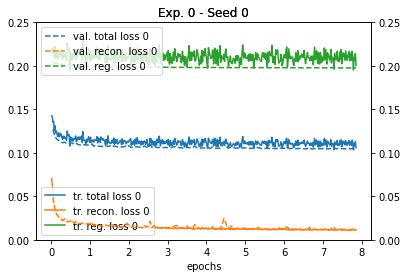

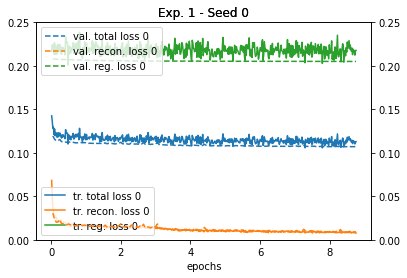

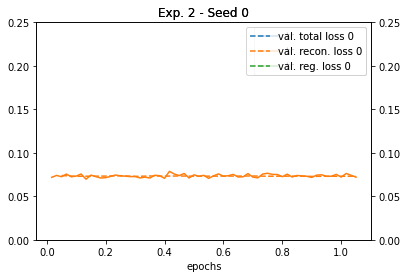

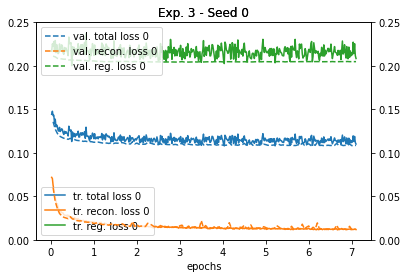

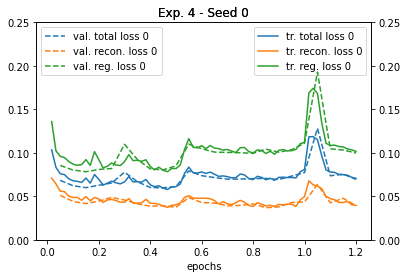

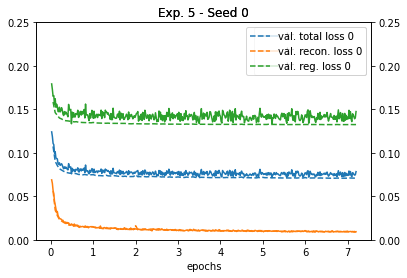

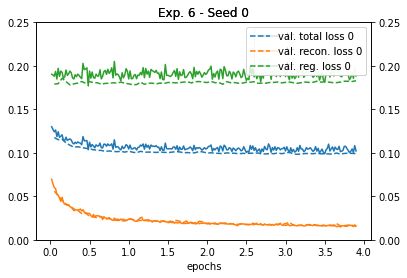

In [57]:
plot_within_experiment(dict_runs, dict_exps)

0.1946768719170774 0.2302751446408885
0.1976555098462411 0.204283252406299


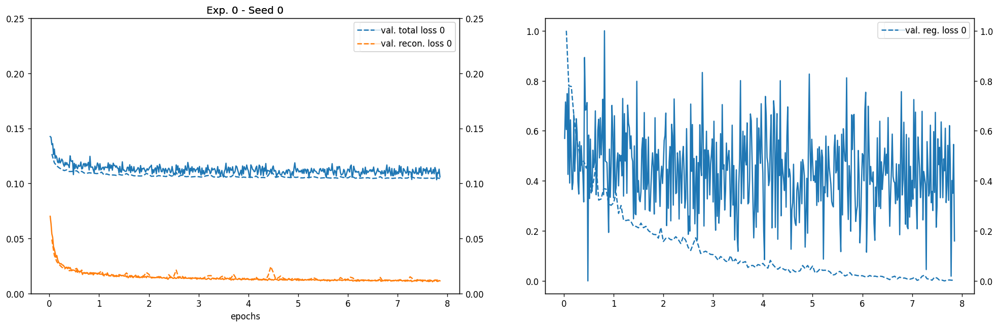

0.2010052468095507 0.238667925872973
0.2050245407593837 0.2079449679854084


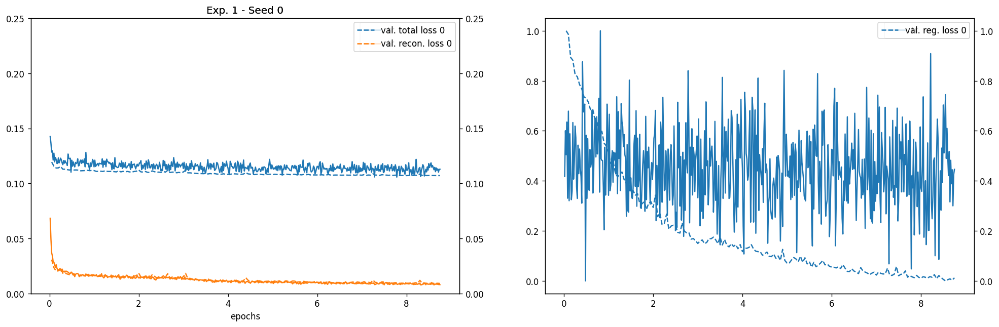

0.4933808437415531 0.533152733530317
0.5299283144816086 0.5299283144816086


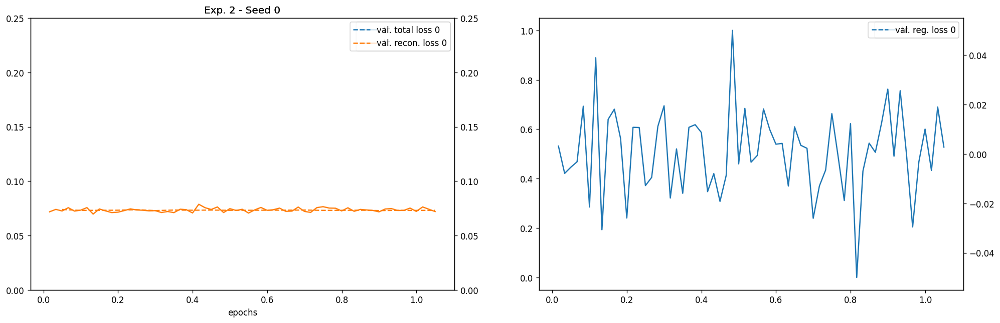

0.2002126307359763 0.2368999385407992
0.204312659257612 0.2111382240975949


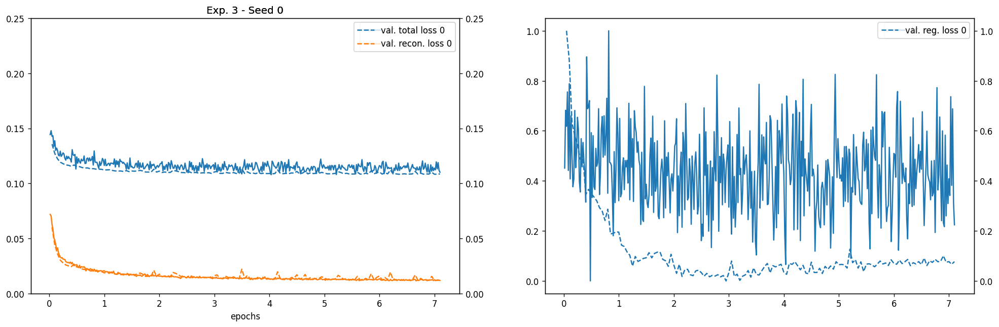

0.0783160627420459 0.1741624415985175
0.0782633926599771 0.1928092906255538


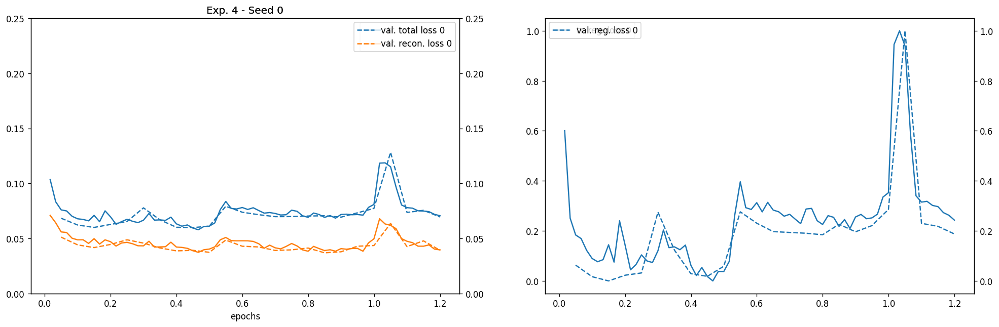

0.1331957283828939 0.1792190309081758
0.1323939474973612 0.1584577521177635


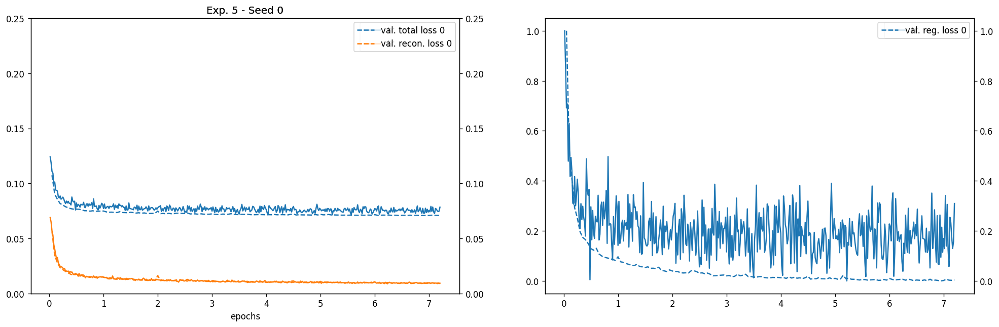

0.1769208300326551 0.2050598590501717
0.1780889806610869 0.1857766715023961


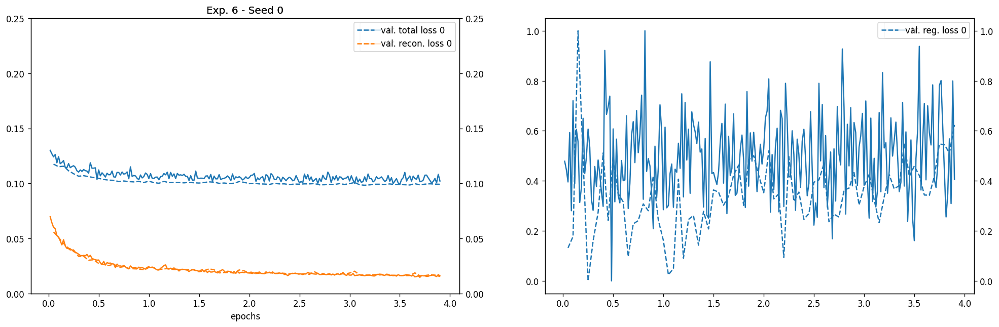

In [58]:
plot_within_experiment2(dict_runs, dict_exps)

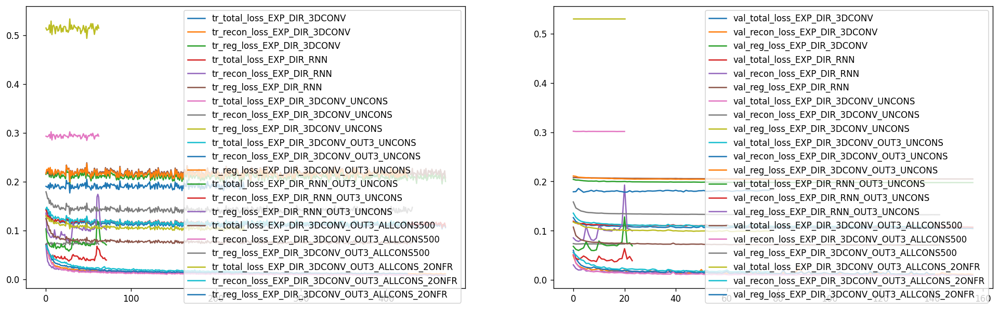

In [79]:
plot_across_experiments(df_train_all, df_val_all)

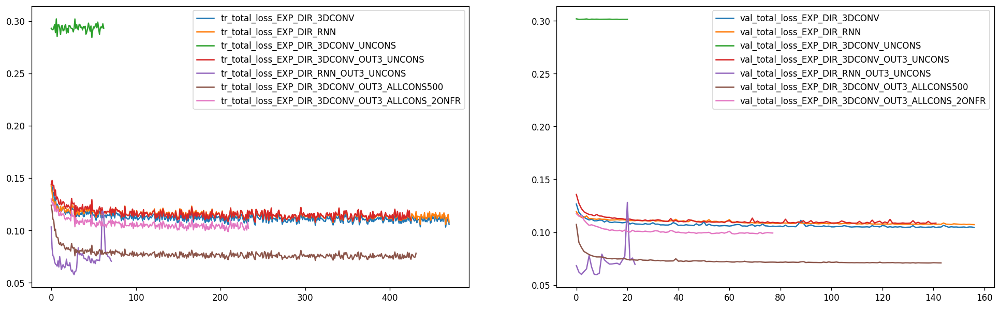

In [81]:
plot_across_experiments_total(df_train_all, df_val_all)

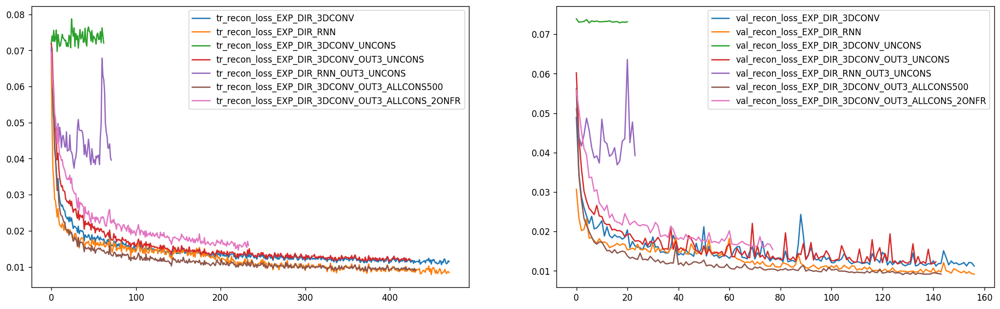

In [84]:
plot_across_experiments_recon(df_train_all, df_val_all)

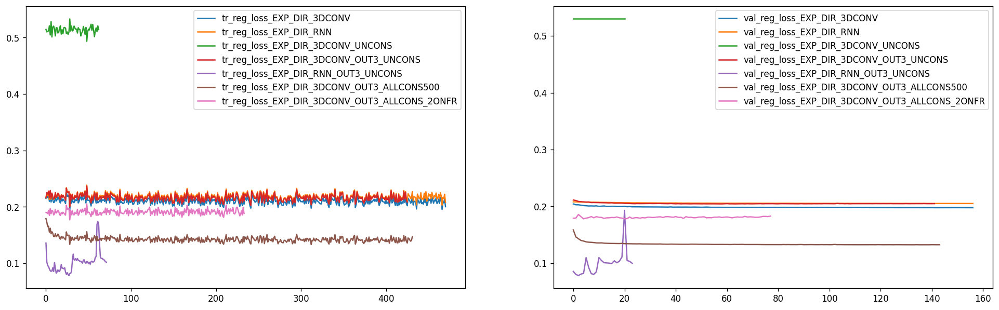

In [85]:
plot_across_experiments_reg(df_train_all, df_val_all)

In [223]:
df_train_all


,avg_recon_loss_e0,std_recon_loss_e0,avg_reg_loss_e0,std_reg_loss_e0,avg_total_loss_e0,std_total_loss_e0,avg_recon_loss_e1,std_recon_loss_e1,avg_reg_loss_e1,std_reg_loss_e1,avg_total_loss_e1,std_total_loss_e1
0,0.070090,NaN,0.214959,NaN,0.142525,NaN,0.068288,NaN,0.216726,NaN,0.142507,NaN
1,0.063467,NaN,0.220141,NaN,0.141804,NaN,0.049518,NaN,0.223627,NaN,0.136573,NaN
2,0.054084,NaN,0.216223,NaN,0.135153,NaN,0.036747,NaN,0.220010,NaN,0.128379,NaN
3,0.050881,NaN,0.221331,NaN,0.136106,NaN,0.034012,NaN,0.224929,NaN,0.129470,NaN
4,0.042565,NaN,0.209834,NaN,0.126199,NaN,0.028791,NaN,0.213459,NaN,0.121125,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
466,0.011204,NaN,0.195352,NaN,0.103278,NaN,0.008534,NaN,0.202810,NaN,0.105672,NaN
467,0.010853,NaN,0.208969,NaN,0.109911,NaN,0.008164,NaN,0.216865,NaN,0.112514,NaN
468,0.011057,NaN,0.207145,NaN,0.109101,NaN,0.008608,NaN,0.215015,NaN,0.111811,NaN
469,0.011710,NaN,0.214101,NaN,0.112906,NaN,0.008709,NaN,0.222306,NaN,0.115508,NaN


In [135]:
df_val_all


,avg_recon_loss_e0,avg_reg_loss_e0,avg_total_loss_e0,avg_recon_loss_e1,avg_reg_loss_e1,avg_total_loss_e1
0,0.048942,0.204283,0.126613,0.030692,0.207945,0.119318
1,0.034634,0.202822,0.118728,0.023391,0.207902,0.115647
2,0.028812,0.202807,0.115809,0.020234,0.207634,0.113934
3,0.026031,0.202061,0.114046,0.020522,0.207600,0.114061
4,0.023913,0.201451,0.112682,0.023245,0.207435,0.115340
...,...,...,...,...,...,...
152,0.012129,0.197656,0.104892,0.009942,0.205141,0.107542
153,0.011280,0.197678,0.104479,0.009402,0.205068,0.107235
154,0.012165,0.197680,0.104922,0.009818,0.205088,0.107453
155,0.012050,0.197673,0.104861,0.009318,0.205072,0.107195


In [136]:
for key in dict_exps.keys():
    print('exp', key)
    print(dict_exps[key])


exp train_e0
     recon_loss_e0_s0  reg_loss_e0_s0  total_loss_e0_s0
0            0.070090        0.214959          0.142525
1            0.063467        0.220141          0.141804
2            0.054084        0.216223          0.135153
3            0.050881        0.221331          0.136106
4            0.042565        0.209834          0.126199
..                ...             ...               ...
466          0.011204        0.195352          0.103278
467          0.010853        0.208969          0.109911
468          0.011057        0.207145          0.109101
469          0.011710        0.214101          0.112906
470          0.011429        0.200363          0.105896

[471 rows x 3 columns]
exp val_e0
     recon_loss_e0_s0  reg_loss_e0_s0  total_loss_e0_s0
0            0.048942        0.204283          0.126613
1            0.034634        0.202822          0.118728
2            0.028812        0.202807          0.115809
3            0.026031        0.202061          0.114046


In [37]:
df_train_sum=pd.read_csv(EXP_DIR+"/training_summary.csv")
df_val_sum =pd.read_csv(EXP_DIR+"/validation_summary.csv")

In [29]:
df_perf_sum = pd.read_csv(EXP_DIR+"/validation_results/performance_summary.csv")
df_val_perf=pd.read_csv(EXP_DIR+"/validation_results/validation_performance.csv")

In [40]:
df_train_sum

,timestamp,epochs,samples,total,reconstruction_loss,regularization_loss,label
0,E00-B070,0.016659,140,0.142507,0.068288,0.216726,training
1,E00-B140,0.033317,280,0.136573,0.049518,0.223627,training
2,E00-B210,0.049976,420,0.128379,0.036747,0.220010,training
3,E00-B280,0.066635,560,0.129470,0.034012,0.224929,training
4,E00-B350,0.083294,700,0.121125,0.028791,0.213459,training
...,...,...,...,...,...,...,...
520,E08-B2870,8.683008,72972,0.111896,0.008160,0.215633,training
521,E08-B2940,8.699667,73112,0.113203,0.008653,0.217754,training
522,E08-B3010,8.716326,73252,0.110179,0.008051,0.212307,training
523,E08-B3080,8.732984,73392,0.112782,0.008557,0.217007,training


In [35]:
df_val_perf

,Unnamed: 0,total,reconstruction_loss,regularization_loss
0,0,0.090772,0.007892,0.173652
1,1,0.089613,0.008733,0.170494
2,2,0.090418,0.009634,0.171202
3,3,0.097511,0.010748,0.184274
4,4,0.108070,0.011432,0.204709
...,...,...,...,...
462,462,0.092059,0.006220,0.177898
463,463,0.084934,0.005708,0.164161
464,464,0.082675,0.005821,0.159530
465,465,0.084725,0.006283,0.163168


In [32]:
df_perf_sum

,Unnamed: 0,total,reconstruction_loss,regularization_loss
0,count,467.000000,467.000000,467.000000
1,mean,0.107461,0.009850,0.205072
2,std,0.023307,0.007473,0.047191
3,min,0.048006,0.000851,0.070159
4,25%,0.093402,0.004036,0.175609
5,50%,0.101947,0.009373,0.201520
6,75%,0.118990,0.013035,0.226175
7,max,0.179601,0.051788,0.355850


<AxesSubplot:title={'center':'Training'}, xlabel='Unnamed: 0'>

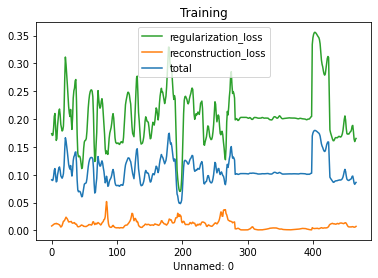

In [34]:
df_val_perf.set_index("Unnamed: 0").plot(y=["total", "reconstruction_loss","regularization_loss"], title="Training", legend='reverse')

In [31]:
def load_transform(directory): #out1
    transform_list = ["input", "phosphenes", "reconstruction", "stimulation"]
    transform_dict = {}
    for item in transform_list:
        f = open(directory+f'/output_history/{item}.pickle', 'rb')
        transform_dict[item]=pickle5.load(f)
        # print(transform_dict[item])
    return transform_dict

In [2]:
def load_transform2(directory): #out3
    transform_list = ["input", "phosphenes", "reconstruction", "stimulation_amplitude",  "stimulation_frequency",  "stimulation_pulse_width"]
    transform_dict = {}
    for item in transform_list:
        f = open(directory+f'/output_history/{item}.pickle', 'rb')
        transform_dict[item]=pickle5.load(f)
        # print(transform_dict[item])
    return transform_dict

In [3]:
EXP_DIR_RNN_OUT3_ALLCONS_2ONPW="/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax_out3_allcons2onpw"

In [10]:
transform_dict=load_transform(EXP_DIR_3DCONV)

/home/burkuc/.conda/envs/etor2/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [38]:
transform_dict2=load_transform(EXP_DIR_RNN)

In [4]:
transform_dict3=load_transform2(EXP_DIR_RNN_OUT3_ALLCONS_2ONPW)

/home/burkuc/.conda/envs/etor2/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [38]:
def plot_transform(transform_dict, title): #out1

    if len(transform_dict["input"][0].shape)==5:
        seq_length = transform_dict["input"][0].shape[2]
    elif len(transform_dict["input"][0].shape)==4:
        seq_length = transform_dict["input"][0].shape[1]
        
    fig, axes = plt.subplots(nrows=len(transform_dict.keys())-1, ncols=seq_length, figsize=(20,6),dpi=120)

    img_typ=len(list(transform_dict.values()))

    for i, ax in enumerate(axes.flatten()):

        k = i//seq_length

        j = i%seq_length

        if len(list(transform_dict.values())[k][0].shape)>3:
            if len(list(transform_dict.values())[k][0].shape) == 4:
                image = list(transform_dict.values())[k][-1][0,j,:,:]


            elif len(list(transform_dict.values())[k][0].shape) == 5:
                image = list(transform_dict.values())[k][-1][0,0,j,:,:]
        
        ax.imshow(image, cmap='gray')
        ax.axis('off')
        ax.grid(visible=False)
    fig.suptitle(title, fontsize=16)
    plt.show()

   


In [40]:
def plot_transform2(transform_dict, title): #out3

    if len(transform_dict["input"][0].shape)==5:
        seq_length = transform_dict["input"][0].shape[2]
    elif len(transform_dict["input"][0].shape)==4:
        seq_length = transform_dict["input"][0].shape[1]
        
    fig, axes = plt.subplots(nrows=len(transform_dict.keys())-3, ncols=seq_length, figsize=(20,6),dpi=120)

    img_typ=len(list(transform_dict.values()))

    for i, ax in enumerate(axes.flatten()):

        k = i//seq_length

        j = i%seq_length

        if len(list(transform_dict.values())[k][0].shape)>3:
            if len(list(transform_dict.values())[k][0].shape) == 4:
                image = list(transform_dict.values())[k][-1][0,j,:,:]


            elif len(list(transform_dict.values())[k][0].shape) == 5:
                image = list(transform_dict.values())[k][-1][0,0,j,:,:]
        
        ax.imshow(image, cmap='gray')
        ax.axis('off')
        ax.grid(visible=False)
    fig.suptitle(title, fontsize=16)
    plt.show()

   


In [5]:
def prepare_gif(transform_dict, title):

    if len(transform_dict["input"][0].shape)==5:
        seq_length = transform_dict["input"][0].shape[2]
    elif len(transform_dict["input"][0].shape)==4:
        seq_length = transform_dict["input"][0].shape[1]
        
    fig, axes = plt.subplots(nrows=len(transform_dict.keys())-3, ncols=seq_length, figsize=(20,6),dpi=120)

    img_typ=len(list(transform_dict.values()))

    image_list=[]

    for i, ax in enumerate(axes.flatten()):
        

        k = i//seq_length

        j = i%seq_length
        # print('i:', i, ' k:', k, ' j:', j)

        if len(list(transform_dict.values())[k][0].shape)>3:
            if len(list(transform_dict.values())[k][0].shape) == 4:
                image = list(transform_dict.values())[k][-1][0,j,:,:]



            elif len(list(transform_dict.values())[k][0].shape) == 5:
                image = list(transform_dict.values())[k][-1][0,0,j,:,:]

            
        image_list.append(image)

        ax.imshow(image, cmap='gray')
        ax.axis('off')
        ax.grid(visible=False)
        
    image_array=np.stack(image_list[:seq_length], axis=0)
    phos_array=np.stack(image_list[seq_length:seq_length*2], axis=0)
    recon_array=np.stack(image_list[seq_length*2:], axis=0)

        
    fig.suptitle(title, fontsize=16)
    plt.show()
    fig.savefig(f'/home/burkuc/data/v_dy/figs/{title}.png', dpi=fig.dpi)
    return image_array, phos_array, recon_array

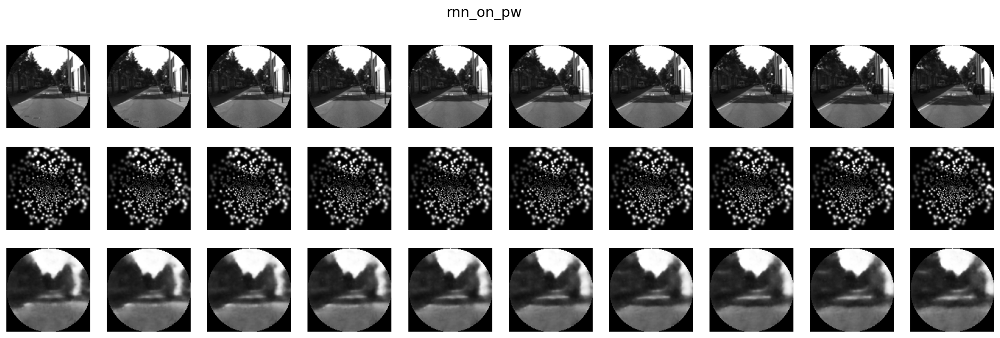

In [6]:
image_array, phos_array, recon_array =prepare_gif(transform_dict3, 'rnn_on_pw')

In [28]:
def generate_gif(images_for_gif, phosphenes_for_gif, recon_for_gif, title):
    frames_for_gif =np.zeros((phosphenes_for_gif.shape[0],phosphenes_for_gif.shape[1],phosphenes_for_gif.shape[2]*3))
    for idx, (frame_idx, phos_idx, recon_idx)  in enumerate(zip(images_for_gif,phosphenes_for_gif,recon_for_gif)):
        frame_idx = cv2.resize(frame_idx, (256,256), interpolation=cv2.INTER_LINEAR)
        recon_idx = cv2.resize(recon_idx, (256,256), interpolation=cv2.INTER_LINEAR)
        frames_for_gif[idx] = np.concatenate((frame_idx,phos_idx, recon_idx), axis=-1)

    imageio.mimsave(f"/home/burkuc/data/v_dy/gifs/{title}.gif",
                    frames_for_gif, format = 'GIF-PIL', duration=1/10)

In [27]:
def generate_video(images_for_gif, phosphenes_for_gif, recon_for_gif, title):
    frames_for_gif =np.zeros((phosphenes_for_gif.shape[0],phosphenes_for_gif.shape[1],phosphenes_for_gif.shape[2]*3))
    for idx, (frame_idx, phos_idx, recon_idx)  in enumerate(zip(images_for_gif,phosphenes_for_gif,recon_for_gif)):
        frame_idx = cv2.resize(frame_idx, (256,256), interpolation=cv2.INTER_LINEAR)
        recon_idx = cv2.resize(recon_idx, (256,256), interpolation=cv2.INTER_LINEAR)
        frames_for_gif[idx] = np.concatenate((frame_idx,phos_idx, recon_idx), axis=-1)

    imageio.mimsave(f"/home/burkuc/data/v_dy/gifs/{title}.mp4",
                    frames_for_gif, fps=10)
  

In [29]:
generate_video(image_array, phos_array, recon_array, 'rnn_on_pw')

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

In [4]:
path=EXP_DIR_RNN_OUT3_ALLCONS_2ONPW
STEP_COUNT=100

In [5]:
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator
event_acc = EventAccumulator(path+'/tensorboard')

# event_acc = EventAccumulator(path+'/tensorboard', size_guidance={
#         'histograms': REAL_STEP_COUNT,
# })
event_acc.Reload()
# Show all tags in the log file
tags = event_acc.Tags()


In [71]:
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator
event_acc2 = EventAccumulator(path+'/tensorboard')

# event_acc = EventAccumulator(path, size_guidance={
#         'histograms': REAL_STEP_COUNT,
# })
event_acc2.Reload()
# Show all tags in the log file
tags2 = event_acc2.Tags()


In [72]:
tags2

{'images': ['phosphenes', 'reconstruction', 'input'],
 'audio': [],
 'histograms': ['encoder/grads/enc.0.weight',
  'encoder/weights/enc.0.weight',
  'encoder/grads/enc.1.weight',
  'encoder/weights/enc.1.weight',
  'encoder/grads/enc.1.bias',
  'encoder/weights/enc.1.bias',
  'encoder/grads/enc.3.weight',
  'encoder/weights/enc.3.weight',
  'encoder/grads/enc.4.weight',
  'encoder/weights/enc.4.weight',
  'encoder/grads/enc.4.bias',
  'encoder/weights/enc.4.bias',
  'encoder/grads/enc.6.weight',
  'encoder/weights/enc.6.weight',
  'encoder/grads/enc.7.weight',
  'encoder/weights/enc.7.weight',
  'encoder/grads/enc.7.bias',
  'encoder/weights/enc.7.bias',
  'encoder/grads/enc.9.conv1.weight',
  'encoder/weights/enc.9.conv1.weight',
  'encoder/grads/enc.9.conv1.bias',
  'encoder/weights/enc.9.conv1.bias',
  'encoder/grads/enc.9.bn1.weight',
  'encoder/weights/enc.9.bn1.weight',
  'encoder/grads/enc.9.bn1.bias',
  'encoder/weights/enc.9.bn1.bias',
  'encoder/grads/enc.9.conv2.weight',
  

In [6]:
hist_dict = {}
for hist_event in event_acc.Histograms("stimulation_frequency_step"):
# for hist_event in event_acc22.Scalars('stimulation/max_freq'):
    print('hist_event',hist_event)
    hist_dict.update({hist_event.step: (hist_event.histogram_value.bucket_limit, #value
                                        hist_event.histogram_value.bucket)}) #count

hist_event HistogramEvent(wall_time=1679205467.2581067, step=74801, histogram_value=HistogramValue(min=0.09090793132781982, max=499.920654296875, num=1000.0, sum=119747.33248969913, sum_squares=30407206.267470673, bucket_limit=[0.08465817105073375, 0.09312398815580714, 0.10243638697138786, 0.11268002566852665, 0.12394802823537933, 0.13634283105891729, 0.14997711416480902, 0.16497482558128992, 0.18147230813941892, 0.19961953895336082, 0.2195814928486969, 0.24153964213356663, 0.2656936063469233, 0.29226296698161564, 0.3214892636797772, 0.35363819004775493, 0.38900200905253046, 0.42790220995778355, 0.47069243095356195, 0.5177616740489182, 0.56953784145381, 0.6264916255991911, 0.6891407881591103, 0.7580548669750213, 0.8338603536725235, 0.917246389039776, 1.0089710279437536, 1.109868130738129, 1.220854943811942, 1.3429404381931362, 1.47723448201245, 1.624957930213695, 1.7874537232350647, 1.9661990955585713, 2.1628190051144287, 2.379100905625872, 2.6170109961884593, 2.8787120958073054, 3.166

2 93 93
93 93


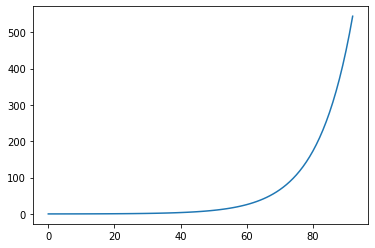

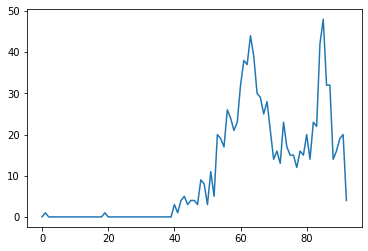

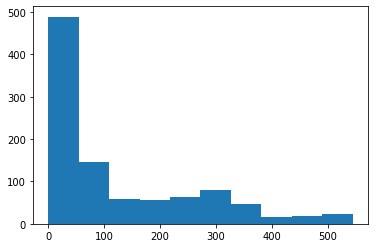

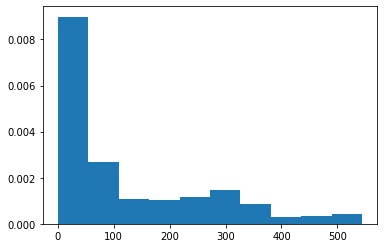

AttributeError: 'list' object has no attribute 'bins'

In [27]:
for item in hist_dict.values():
    print(len(item), len(item[0]), len(item[1]))
    print(len(item[0]), len(item[1]))
    plt.plot(item[0])
    plt.show()
    plt.plot(item[1])
    plt.show()
    plt.hist(item[0], weights=item[1], histtype='stepfilled')
    plt.show()
    plt.hist(item[0], weights=item[1], density=True) #, histtype='stepfilled')
    plt.show()
    plt.hist(item[1], bins=item[1].bins)
    plt.show()

In [93]:
hist_dict.values()

dict_values([([0.08465817105073375, 0.09312398815580714, 0.10243638697138786, 0.11268002566852665, 0.12394802823537933, 0.13634283105891729, 0.14997711416480902, 0.16497482558128992, 0.18147230813941892, 0.19961953895336082, 0.2195814928486969, 0.24153964213356663, 0.2656936063469233, 0.29226296698161564, 0.3214892636797772, 0.35363819004775493, 0.38900200905253046, 0.42790220995778355, 0.47069243095356195, 0.5177616740489182, 0.56953784145381, 0.6264916255991911, 0.6891407881591103, 0.7580548669750213, 0.8338603536725235, 0.917246389039776, 1.0089710279437536, 1.109868130738129, 1.220854943811942, 1.3429404381931362, 1.47723448201245, 1.624957930213695, 1.7874537232350647, 1.9661990955585713, 2.1628190051144287, 2.379100905625872, 2.6170109961884593, 2.8787120958073054, 3.1665833053880363, 3.48324163592684, 3.8315657995195243, 4.214722379471477, 4.636194617418625, 5.099814079160488, 5.609795487076537, 6.1707750357841915, 6.7878525393626115, 7.466637793298873, 8.213301572628762, 9.0346

ValueError: x and y can be no greater than 2D, but have shapes (1,) and (1, 2, 93)

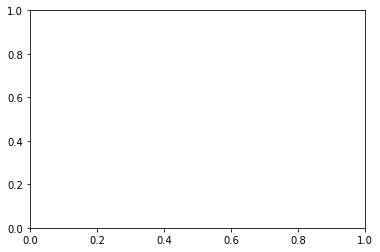

In [83]:
plt.plot(hist_dict.values())
plt.show()

HistogramEvent(wall_time=1679205467.2581067, step=74801, histogram_value=HistogramValue(min=0.09090793132781982, max=499.920654296875, num=1000.0, sum=119747.33248969913, sum_squares=30407206.267470673, bucket_limit=[0.08465817105073375, 0.09312398815580714, 0.10243638697138786, 0.11268002566852665, 0.12394802823537933, 0.13634283105891729, 0.14997711416480902, 0.16497482558128992, 0.18147230813941892, 0.19961953895336082, 0.2195814928486969, 0.24153964213356663, 0.2656936063469233, 0.29226296698161564, 0.3214892636797772, 0.35363819004775493, 0.38900200905253046, 0.42790220995778355, 0.47069243095356195, 0.5177616740489182, 0.56953784145381, 0.6264916255991911, 0.6891407881591103, 0.7580548669750213, 0.8338603536725235, 0.917246389039776, 1.0089710279437536, 1.109868130738129, 1.220854943811942, 1.3429404381931362, 1.47723448201245, 1.624957930213695, 1.7874537232350647, 1.9661990955585713, 2.1628190051144287, 2.379100905625872, 2.6170109961884593, 2.8787120958073054, 3.16658330538803

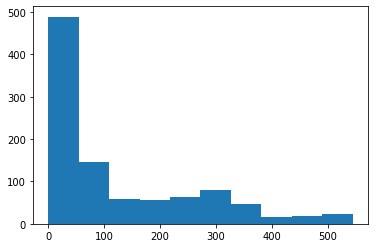

In [45]:
histograms = event_acc.Histograms('stimulation_frequency_step')
hist_data = histograms[0]
print(hist_data)
values = hist_data[2].bucket_limit
print(values)
bins = hist_data[2].bucket
print(bins)

# Plot histogram using matplotlib
plt.hist(values, weights=bins)
plt.show()

In [22]:
histograms

[HistogramEvent(wall_time=1679205467.2581067, step=74801, histogram_value=HistogramValue(min=0.09090793132781982, max=499.920654296875, num=1000.0, sum=119747.33248969913, sum_squares=30407206.267470673, bucket_limit=[0.08465817105073375, 0.09312398815580714, 0.10243638697138786, 0.11268002566852665, 0.12394802823537933, 0.13634283105891729, 0.14997711416480902, 0.16497482558128992, 0.18147230813941892, 0.19961953895336082, 0.2195814928486969, 0.24153964213356663, 0.2656936063469233, 0.29226296698161564, 0.3214892636797772, 0.35363819004775493, 0.38900200905253046, 0.42790220995778355, 0.47069243095356195, 0.5177616740489182, 0.56953784145381, 0.6264916255991911, 0.6891407881591103, 0.7580548669750213, 0.8338603536725235, 0.917246389039776, 1.0089710279437536, 1.109868130738129, 1.220854943811942, 1.3429404381931362, 1.47723448201245, 1.624957930213695, 1.7874537232350647, 1.9661990955585713, 2.1628190051144287, 2.379100905625872, 2.6170109961884593, 2.8787120958073054, 3.1665833053880

In [80]:
hist_dict

{74801: ([0.08465817105073375,
   0.09312398815580714,
   0.10243638697138786,
   0.11268002566852665,
   0.12394802823537933,
   0.13634283105891729,
   0.14997711416480902,
   0.16497482558128992,
   0.18147230813941892,
   0.19961953895336082,
   0.2195814928486969,
   0.24153964213356663,
   0.2656936063469233,
   0.29226296698161564,
   0.3214892636797772,
   0.35363819004775493,
   0.38900200905253046,
   0.42790220995778355,
   0.47069243095356195,
   0.5177616740489182,
   0.56953784145381,
   0.6264916255991911,
   0.6891407881591103,
   0.7580548669750213,
   0.8338603536725235,
   0.917246389039776,
   1.0089710279437536,
   1.109868130738129,
   1.220854943811942,
   1.3429404381931362,
   1.47723448201245,
   1.624957930213695,
   1.7874537232350647,
   1.9661990955585713,
   2.1628190051144287,
   2.379100905625872,
   2.6170109961884593,
   2.8787120958073054,
   3.1665833053880363,
   3.48324163592684,
   3.8315657995195243,
   4.214722379471477,
   4.636194617418625,
 

In [51]:
event_acc = EventAccumulator(path, size_guidance={
    'histograms': STEP_COUNT,
})
event_acc.Reload()
tags = event_acc.Tags()
result = {}
for hist in tags['histograms']:
    print('hist', hist)
    histograms = event_acc.Histograms(hist)
    result[hist] = np.array([np.repeat(np.array(h.histogram_value.bucket_limit), np.array(h.histogram_value.bucket).astype(np.int)) for h in histograms])
print(result)

{}


In [13]:
PATH_Of_FILE=path+'/tensorboard/events.out.tfevents.1679176403.mars.1384088.0'
from tensorboard.backend.event_processing.event_file_loader import EventFileLoader
# Just in case, PATH_OF_FILE is the path of the file, not the folder
loader = EventFileLoader(PATH_Of_FILE)


In [14]:
tag_list = ['stimulation_all', 'stimulation_amplitude_all', 'stimulation_frequency_all', 'stimulation_pulse_width_all', 'stimulation_step', 'stimulation_amplitude_step', 'stimulation_frequency_step','stimulation_pulse_width_step', '/loss/training', '/loss/validation', 'stimulation/max_total_charge']


In [19]:
dict_tensorboard={}
# Where to store values
# wtimes,steps,actions = [],[],[]
for event in loader.Load():
    wtime   = event.wall_time
    step    = event.step
    if len(event.summary.value) > 0:
        summary = event.summary.value[0]
        # if summary.tag == "stimulation_amplitude_all": #HISTOGRAM_TAG:
        wtimes,steps,actions = [],[],[]
        # if summary.tag in tag_list: #HISTOGRAM_TAG:
        if summary.tag =="stimulation_amplitude_all":
            dict_tensorboard[summary.tag]={}
            # print(summary.tag, 'wt', wtime, 'st', step , 'num', summary.histo.num)
            wtimes += [wtime]*int(summary.histo.num)
            steps  += [step] *int(summary.histo.num)
            # print('len',len(summary.histo.bucket),len(summary.histo.bucket_limit))

            for num,val in zip(summary.histo.bucket,summary.histo.bucket_limit):
                print('num', num, 'val', val)
                actions += [val] *int(num)
                
            dict_tensorboard[summary.tag]['wtimes'] = wtimes
            dict_tensorboard[summary.tag]['steps'] = steps
            dict_tensorboard[summary.tag]['actions'] = actions


In [20]:
dict_tensorboard

{'stimulation_amplitude_all': {'wtimes': [], 'steps': [], 'actions': []}}

In [37]:
dict_tensorboard['stimulation_frequency_step']

{'wtimes': [], 'steps': [], 'actions': []}

In [36]:
actions

[]

In [33]:
event_acc2

In [48]:
tags2

{'images': [],
 'audio': [],
 'histograms': [],
 'scalars': [],
 'distributions': [],
 'tensors': [],
 'graph': False,
 'meta_graph': False,
 'run_metadata': []}

In [54]:
tags

{'images': ['phosphenes', 'reconstruction', 'input'],
 'audio': [],
 'histograms': ['encoder/grads/enc.0.weight',
  'encoder/weights/enc.0.weight',
  'encoder/grads/enc.1.weight',
  'encoder/weights/enc.1.weight',
  'encoder/grads/enc.1.bias',
  'encoder/weights/enc.1.bias',
  'encoder/grads/enc.3.weight',
  'encoder/weights/enc.3.weight',
  'encoder/grads/enc.4.weight',
  'encoder/weights/enc.4.weight',
  'encoder/grads/enc.4.bias',
  'encoder/weights/enc.4.bias',
  'encoder/grads/enc.6.weight',
  'encoder/weights/enc.6.weight',
  'encoder/grads/enc.7.weight',
  'encoder/weights/enc.7.weight',
  'encoder/grads/enc.7.bias',
  'encoder/weights/enc.7.bias',
  'encoder/grads/enc.9.conv1.weight',
  'encoder/weights/enc.9.conv1.weight',
  'encoder/grads/enc.9.conv1.bias',
  'encoder/weights/enc.9.conv1.bias',
  'encoder/grads/enc.9.bn1.weight',
  'encoder/weights/enc.9.bn1.weight',
  'encoder/grads/enc.9.bn1.bias',
  'encoder/weights/enc.9.bn1.bias',
  'encoder/grads/enc.9.conv2.weight',
  

In [55]:
event_acc.Histograms().Tags()


TypeError: Histograms() missing 1 required positional argument: 'tag'

In [62]:
result = {}
for hist in tags['histograms']:
    if hist in tag_list:
        histograms = event_acc.Histograms(hist)
        result[hist] = np.array([np.repeat(np.array(h.histogram_value.bucket_limit), np.array(h.histogram_value.bucket).astype(np.int)) for h in histograms])
        print(hist, result[hist].shape)

stimulation_amplitude_all (1, 10000)
stimulation_amplitude_step (1, 1000)
stimulation_pulse_width_all (1, 10000)
stimulation_pulse_width_step (1, 1000)
stimulation_frequency_all (1, 10000)
stimulation_frequency_step (1, 1000)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


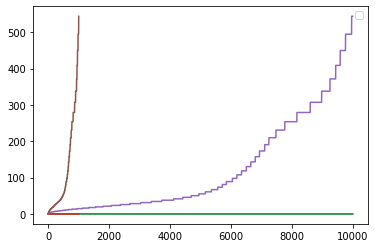

In [64]:
for hist in tags['histograms']:
    if hist in tag_list:
        plt.plot(result[hist][0])
plt.show()

In [37]:
hist_dict = {}
# for hist_event in event_acc.Histograms('normal/moving_mean'):
for hist_event in event_acc.Scalars('stimulation/max_freq'):
    print('hist_event',hist_event)
    hist_dict.update({hist_event.step: (hist_event.histogram_value.bucket_limit,
                                        hist_event.histogram_value.bucket)})

KeyError: 'Key stimulation/max_freq was not found in Reservoir'

In [29]:
hist_dict = {}
# for hist_event in event_acc.Histograms('normal/moving_mean'):
for hist_event in event_acc.Histograms('stimulation_freqency_all'):
    print('hist_event',hist_event)
    hist_dict.update({hist_event.step: (hist_event.histogram_value.bucket_limit,
                                        hist_event.histogram_value.bucket)})

KeyError: 'Key stimulation_freqency_all was not found in Reservoir'

In [13]:
def reload_model_config(yaml_file, run_path):
    with open(yaml_file) as file:
        raw_content = yaml.load(file,Loader=yaml.FullLoader) # nested dictionary
    cfg= {k:v for params in raw_content.values() for k,v in params.items()} # unpacked
    # cfg['device'] = 'cpu'
    # cfg['gpu'] = None
    cfg['save_path'] = run_path
    return cfg
    

In [14]:
def get_simulator(cfg):
    # initialise simulator
    params = dynaphos.utils.load_params(cfg['base_config'])
    params['run'].update(cfg)
    params['thresholding'].update(cfg)
    device = get_data_kwargs(params)['device']

    with open(cfg['phosphene_map'], 'rb') as handle:
        coordinates_visual_field = pickle.load(handle, )
    simulator = PhospheneSimulator(params, coordinates_visual_field)
    cfg['SPVsize'] = simulator.phosphene_maps.shape[-2:]
    return simulator

In [15]:
def get_model_architecture(cfg):
    if cfg['model_architecture'] == 'recurrent_net':
        encoder, decoder = m.get_e2e_recurrent_net(cfg)
    #added
    elif cfg['model_architecture'] == 'recurrent_net_out3':
        encoder, decoder = m.get_e2e_recurrent_net_out3(cfg)
    #added
    elif cfg['model_architecture'] == 'recurrent_net_out32':
        encoder, decoder = m.get_e2e_recurrent_net_out32(cfg)
    elif cfg['model_architecture'] == 'zhao-autoencoder':
        encoder, decoder = m.get_Zhao_autoencoder(cfg)
    #added
    elif cfg['model_architecture'] == 'zhao-autoencoder_out3':
        encoder, decoder = m.get_Zhao_autoencoder_out3(cfg)
    #added
    elif cfg['model_architecture'] == 'zhao-autoencoder_out32':
        encoder, decoder = m.get_Zhao_autoencoder_out32(cfg)
    else:
        raise NotImplementedError

    simulator = get_simulator(cfg)
    # print('simul', simulator.device)

    models = {'encoder' : encoder,
              'decoder' : decoder,
            #   'optimizer': optimizer,
              'simulator': simulator,}

    return models

In [14]:
# def load_params(model, cfg, prefix):
#     fn = os.path.join(cfg['save_path'], 'checkpoints', f'{prefix}_encoder.pth')
#     model.load_state_dict(torch.load(fn, map_location=cfg['device']))
#     return model

In [16]:
def load_models(models, cfg, prefix='best'):
    for name, model in models.items():
        if isinstance(model, torch.nn.Module):
            fn = os.path.join(cfg['save_path'], 'checkpoints', f'{prefix}_{name}.pth')
            model.load_state_dict(torch.load(fn, map_location=cfg['device']))
    return models

In [15]:
# def load_checkpoint_with_cfg(model, cfg, prefix='last'):
#     fn = os.path.join(cfg['save_path'], 'checkpoints', f'{prefix}_checkpoint.pth')
#     state = torch.load(fn, map_location=cfg['device'])
#     model.load_state_dict(state['state_dict_encoder'])
#     epoch = state["epoch"]
#     cfg = state["cfg"] 
#     best_validation_performance = state["best_validation_performance"]
#     # return epoch, batch_idx, best_validation_performance
#     return model, epoch, best_validation_performance

In [17]:
def load_models_to_resume_training(models, cfg, prefix='last'):
    fn = os.path.join(cfg['save_path'], 'checkpoints', f'{prefix}_checkpoint.pth')
    state = torch.load(fn, map_location=cfg['device'])
    for name, model in models.items():
        # print('name, model', name, model)
        if isinstance(model, torch.nn.Module):
            # print('isinstance name, model', name, model)
            model.load_state_dict(state['state_dict_'+name])
    epoch = state["epoch"]
    # batch_idx = state["batch_idx"]
    cfg = state["cfg"] 
    best_validation_performance = state["best_validation_performance"]
    # return epoch, batch_idx, best_validation_performance
    return models, epoch, best_validation_performance

In [18]:
import pickle5 as pickle

In [19]:
yaml_file= '/home/burkuc/viseon_dyna/_config/exp1_feb.yaml'
run_path= '/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax_readout_cons'
cfg = reload_model_config(yaml_file,run_path)
models = get_model_architecture(cfg)


simseed 0
self.fps tensor(10., device='cuda:2')


In [21]:
models_best = load_models(models, cfg, 'best')
models, epoch, best_perf = load_models_to_resume_training(models, cfg, 'last')

In [22]:
models

{'encoder': E2E_Encoder_RNN(
   (enc): Sequential(
     (0): Conv2d(10, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (2): LeakyReLU(negative_slope=0.01, inplace=True)
     (3): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
     (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (5): LeakyReLU(negative_slope=0.01, inplace=True)
     (6): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
     (7): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (8): LeakyReLU(negative_slope=0.01, inplace=True)
     (9): ResidualBlock(
       (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
       (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       (relu): LeakyReLU(negative_slope=0.01, inplac

In [44]:
cfg

{'model_name': 'kitty_zhao_sig_fps10_sliding_rnn_nomax_readout_cons_test',
 'use_deterministic_algorithms': False,
 'batch_size': 2,
 'device': 'cuda:2',
 'gpu': 2,
 'save_path': '/home/burkuc/data/v_dy/kitty_zhao_sig_fps10_sliding_rnn_nomax_readout_cons',
 'save_output': ['phosphenes',
  'stimulation',
  'reconstruction',
  'input',
  'total_charge'],
 'seed': 0,
 'base_config': '/home/burkuc/dynaphos/config/params.yaml',
 'use_threshold': False,
 'fps': 10,
 'phosphene_map': '/home/burkuc/dynaphos/config/DefaultCoordinateMap_1000_phosphenes.pickle',
 'model_architecture': 'recurrent_net',
 'in_channels': 10,
 'n_electrodes': 1000,
 'output_scaling': 0.0005,
 'output_steps': 'None',
 'out_channels': 1,
 'out_activation': 'sigmoid',
 'rnn_hidden_size': 1000,
 'rnn_input_size': 512,
 'rnn_num_layers': 1,
 'constrained': True,
 'learning_rate': 0.0001,
 'epochs': 45,
 'trainstats_per_epoch': 60,
 'validations_per_epoch': 20,
 'early_stop_criterium': 15,
 'pipeline': 'unconstrained-video-

In [23]:
def get_training_pipeline(cfg):
    if cfg['pipeline'] == 'unconstrained-video-reconstruction':
        forward, lossfunc = init_training.get_pipeline_unconstrained_video_reconstruction(cfg)
    #added
    elif cfg['pipeline'] == 'unconstrained-video-reconstruction_rnn':
        forward, lossfunc = init_training.get_pipeline_unconstrained_video_reconstruction_rnn(cfg)
    #added
    elif cfg['pipeline'] == 'unconstrained-video-reconstruction_rnn_out3':
        forward, lossfunc = init_training.get_pipeline_unconstrained_video_reconstruction_rnn_out3(cfg)
    #added
    elif cfg['pipeline'] == 'unconstrained-video-reconstruction_out3':
        forward, lossfunc = init_training.get_pipeline_unconstrained_video_reconstruction_out3(cfg)
    else:
        print(cfg['pipeline'] + 'not supported yet')
        raise NotImplementedError

    return {'forward': forward, 'compound_loss_func': lossfunc}

In [24]:
forward=get_training_pipeline(cfg)['forward']

In [25]:
valset = local_datasets.KITTI_Dataset(device=cfg['device'],
                            directory=cfg['data_directory'],
                            mode=cfg['mode'],
                            n_frames=cfg['sequence_length'],
                            imsize=(128, 128),
                            validation=True,
                            load_preprocessed = cfg['load_preprocessed'],
                            sliding_sequences=cfg['sliding_sequences'])
# cfg['circular_mask'] = valset._mask.to(cfg['device'])

self.gpu_last False
loading
loaded
input torch.Size([9339, 1, 10, 128, 128])


/home/burkuc/.conda/envs/etor2/lib/python3.7/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


data torch.Size([934, 1, 10, 128, 128]) val: True


In [26]:
cfg['circular_mask'] = valset._mask.to(cfg['device'])

In [27]:

valloader = DataLoader(valset,batch_size=cfg['batch_size'],shuffle=False, drop_last=True)
example_batch = next(iter(valloader))
# cfg['circular_mask'] = trainset._mask.to(cfg['device'])


In [28]:
valset.device

'cuda:2'

In [46]:
valset.to(cfg['device'])

AttributeError: 'KITTI_Dataset' object has no attribute 'to'

In [36]:
print(len(valloader), len(valset), valset[0].shape)


467 934 torch.Size([1, 10, 128, 128])


In [17]:
example_batch.shape

torch.Size([2, 1, 10, 128, 128])

In [39]:
np.random.seed(0)
example_images=np.random.randint(len(valset), size=2)

AttributeError: 'E2E_Encoder_RNN' object has no attribute 'device'

In [30]:
torch.use_deterministic_algorithms(False)

In [31]:

for batch_idx, batch in enumerate(valloader, 1):  # range(100):
        batch=batch.to(cfg['device'])
        # Forward pass
        with torch.no_grad():
            model_output = forward(batch, models, cfg)
            print(model_output)
            # exit()

{'stimulation': tensor([[[4.3369e-04, 3.6355e-06, 5.3431e-05,  ..., 2.5401e-04,
          4.9770e-04, 2.2598e-04],
         [4.0750e-04, 2.1983e-06, 5.5783e-05,  ..., 1.6246e-04,
          4.9913e-04, 2.0099e-04]],

        [[2.9993e-04, 3.7057e-06, 2.5439e-05,  ..., 7.7195e-05,
          4.9962e-04, 1.5075e-04],
         [2.2181e-04, 1.8108e-06, 2.9619e-05,  ..., 4.7343e-05,
          4.9979e-04, 1.5959e-04]],

        [[1.7954e-04, 1.3766e-06, 2.9104e-05,  ..., 1.2026e-04,
          4.9985e-04, 1.2528e-04],
         [1.6565e-04, 8.8298e-07, 3.6614e-05,  ..., 5.9487e-05,
          4.9964e-04, 1.3766e-04]],

        ...,

        [[2.1668e-04, 7.6851e-07, 2.8525e-05,  ..., 3.4207e-05,
          4.9958e-04, 1.7855e-04],
         [2.5018e-04, 1.2471e-06, 1.8036e-05,  ..., 7.1926e-06,
          4.9966e-04, 2.3289e-04]],

        [[2.2992e-04, 1.3007e-06, 1.5912e-05,  ..., 2.7401e-05,
          4.9956e-04, 2.4594e-04],
         [2.4250e-04, 1.6581e-06, 1.5232e-05,  ..., 5.0572e-06,
       

KeyboardInterrupt: 

In [43]:
valset[example_images].shape

torch.Size([2, 1, 10, 128, 128])

In [41]:
model_output = forward(valset[example_images], models, cfg)

In [ ]:

for img in example_images:
    fig, axes = plt.subplots(1,valset[example_images].shape[2],figsize=(20,6),dpi=120)
    for i, ax in enumerate(axes.flatten()):
        ax.imshow(valset[img,0,i].cpu().numpy(),  cmap='gray')
        ax.axis('off')
        ax.grid(visible=False)
    plt.show()

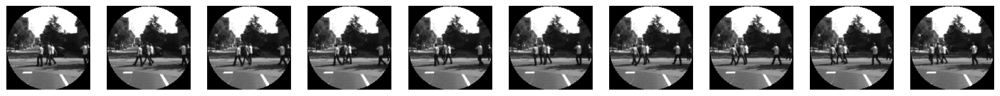

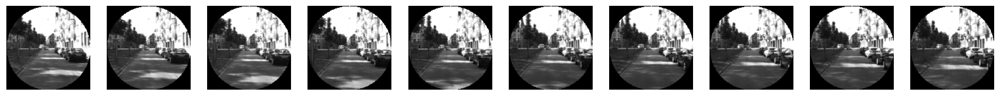

In [46]:

for img in example_images:
    fig, axes = plt.subplots(1,valset[example_images].shape[2],figsize=(20,6),dpi=120)
    for i, ax in enumerate(axes.flatten()):
        ax.imshow(valset[img,0,i].cpu().numpy(),  cmap='gray')
        ax.axis('off')
        ax.grid(visible=False)
    plt.show()

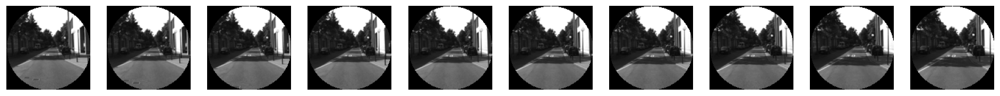

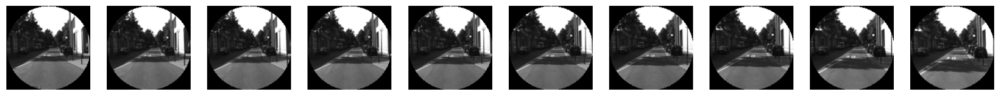

In [21]:

for b in range(next(iter(valloader)).shape[0]):
    fig, axes = plt.subplots(1,example_batch.shape[2],figsize=(20,6),dpi=120)
    for i, ax in enumerate(axes.flatten()):
        ax.imshow(example_batch[b,0,i],  cmap='gray')
        ax.axis('off')
        ax.grid(visible=False)
    plt.show()

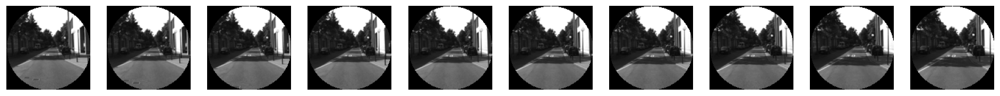

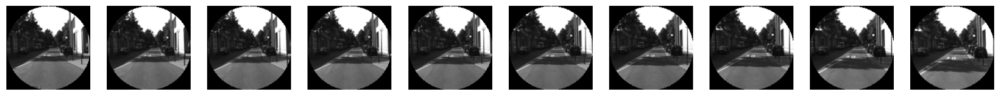

In [33]:

for b in range(next(iter(valloader)).shape[0]):
    fig, axes = plt.subplots(1,example_batch.shape[2],figsize=(20,6),dpi=120)
    for i, ax in enumerate(axes.flatten()):
        ax.imshow(example_batch[b,0,i],  cmap='gray')
        ax.axis('off')
        ax.grid(visible=False)
    plt.show()

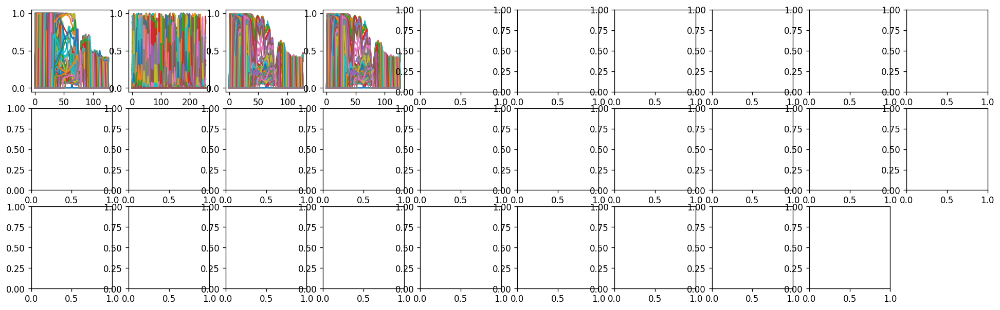

In [62]:
seq_length = transform_dict["input"][0].shape[2]
    
fig, axes = plt.subplots(nrows=len(transform_dict.keys())-1, ncols=seq_length, figsize=(20,6),dpi=120)

for (i, ax), k in zip(enumerate(axes.flatten()), range(len(list(transform_dict.values())))):

    if len(list(transform_dict.values())[k][-1].shape)>3:
        if len(list(transform_dict.values())[k][-1].shape) == 4:
            image = list(transform_dict.values())[k][-1][0,i,:,:]


        elif len(list(transform_dict.values())[k][-1].shape) == 5:
            image = list(transform_dict.values())[k][-1][0,0,i,:,:]
    
    ax.plot(image)
    # plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.grid(visible=False)
plt.show()